In [1]:
# Import necessary libraries
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.ensemble import IsolationForest
from sklearn.decomposition import PCA
from matplotlib.patches import Ellipse
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# Load the data
info_A1 = pd.read_csv(r"C:\Users\pingk\Downloads\fadhli nitip\asik.csv")

In [2]:
# Define the function to remove outliers
def remove_outliers(df):
    numeric_cols = df.select_dtypes(include=['number']).columns
    df_numeric = df[numeric_cols]
    
    iso = IsolationForest(contamination=0.05)
    yhat = iso.fit_predict(df_numeric)
    mask = yhat != -1
    df_cleaned = df[mask].reset_index(drop=True)
    return df_cleaned

# Clean the data by removing outliers
df = remove_outliers(info_A1)

# Identify numeric and string columns
numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
string_cols = df.select_dtypes(exclude=[np.number]).columns.tolist()

# Standardize the numeric data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df[numeric_cols])

# Perform PCA
pca = PCA(n_components=4)  # Increase the number of components to 4
principal_components = pca.fit_transform(scaled_data)

# Create a DataFrame with the principal components
pc_df = pd.DataFrame(data=principal_components, columns=['Principal Component 1', 'Principal Component 2', 'Principal Component 3', 'Principal Component 4'])

# Concatenate the string columns for visualization purposes
result_df = pd.concat([df[string_cols], pc_df], axis=1)

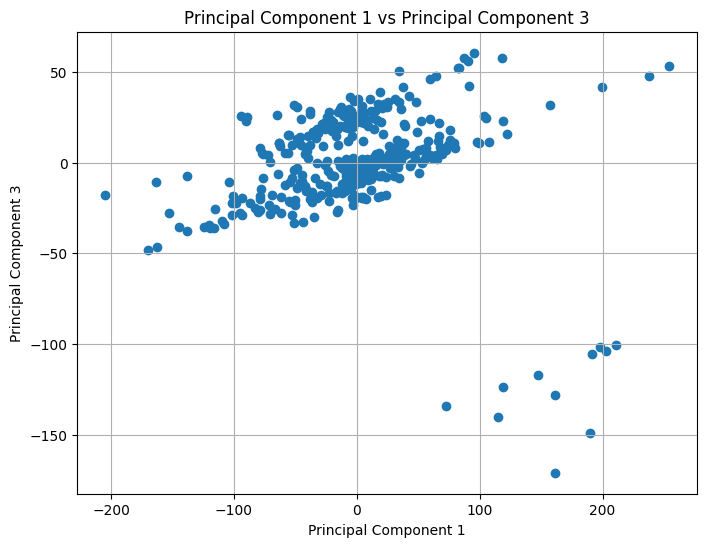

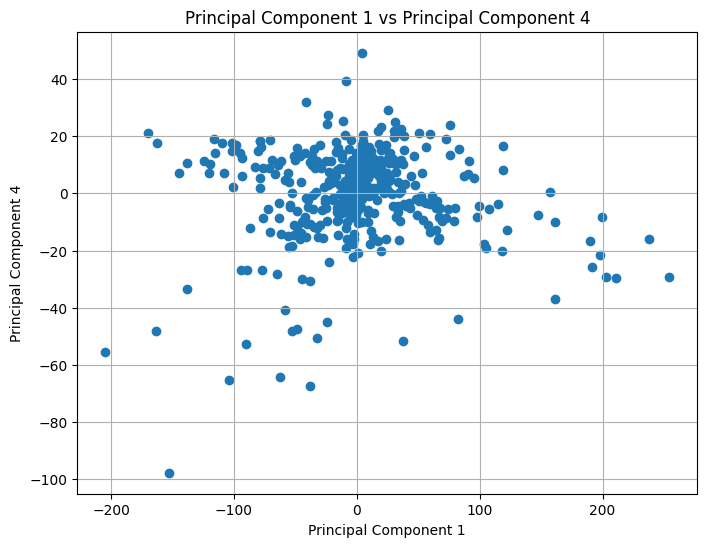

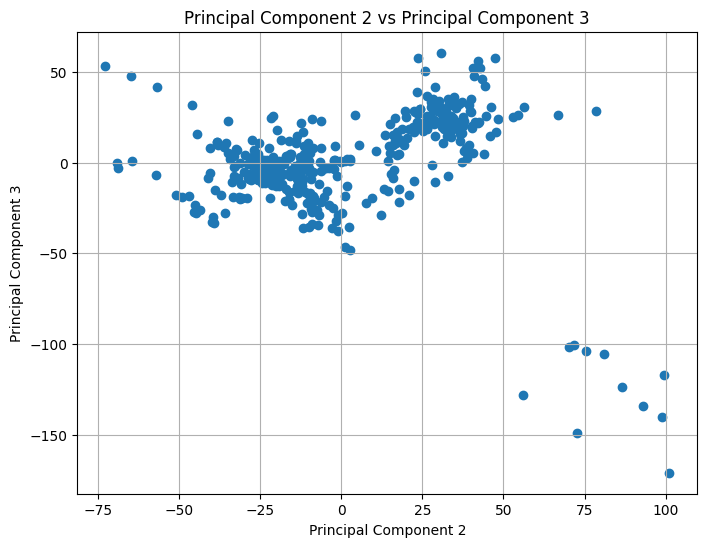

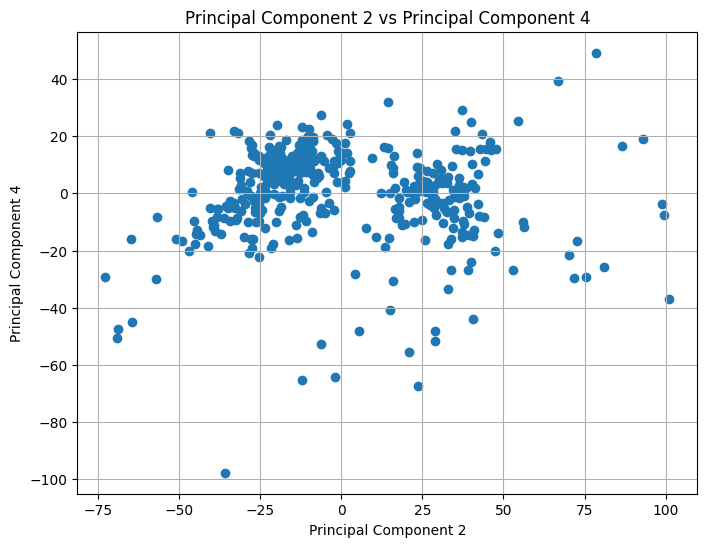

Explained variance ratio: [0.51169789 0.13279639 0.1151352  0.03777116]


In [3]:
# Plotting the additional principal component combinations
def plot_pca_components(result_df, comp1, comp2):
    plt.figure(figsize=(8, 6))
    plt.scatter(result_df[comp1], result_df[comp2])
    plt.title(f'{comp1} vs {comp2}')
    plt.xlabel(comp1)
    plt.ylabel(comp2)
    plt.grid(True)
    plt.show()

# PC1 vs PC3
plot_pca_components(result_df, 'Principal Component 1', 'Principal Component 3')

# PC1 vs PC4
plot_pca_components(result_df, 'Principal Component 1', 'Principal Component 4')

# PC2 vs PC3
plot_pca_components(result_df, 'Principal Component 2', 'Principal Component 3')

# PC2 vs PC4
plot_pca_components(result_df, 'Principal Component 2', 'Principal Component 4')

# Print the explained variance ratio for the first 4 components
print('Explained variance ratio:', pca.explained_variance_ratio_)

CLUSTERING

In [4]:
# Perform KMeans clustering
kmeans = KMeans(n_clusters=2, random_state=42)
clusters = kmeans.fit_predict(result_df.select_dtypes(include=[np.number]))
result_df['Cluster'] = clusters

In [5]:
string_cols

['prov_char',
 'country_char',
 'wavenumber',
 'tgp_name',
 'dgp_name',
 'fgp_name',
 'country_name',
 'thnoth_name']

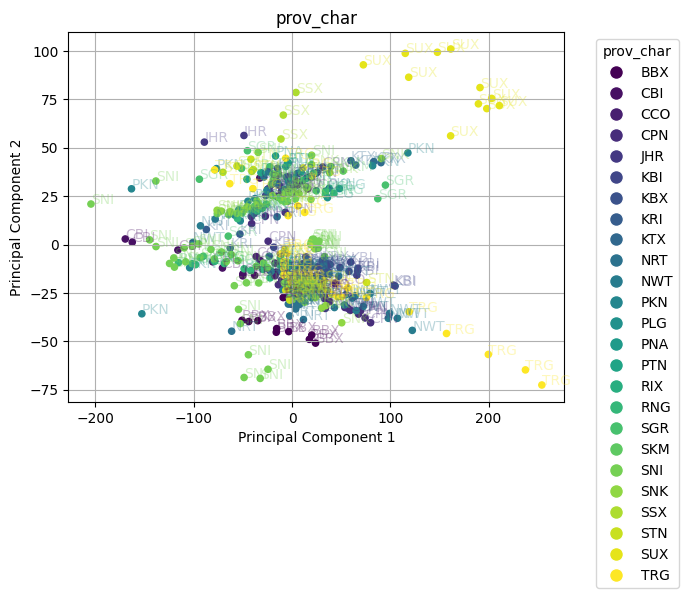

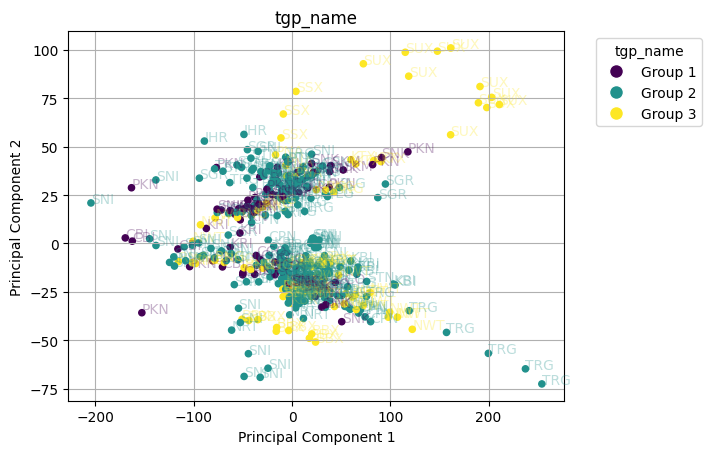

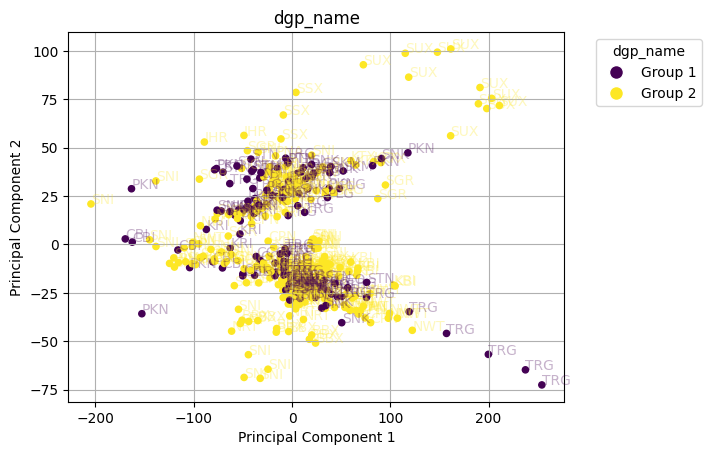

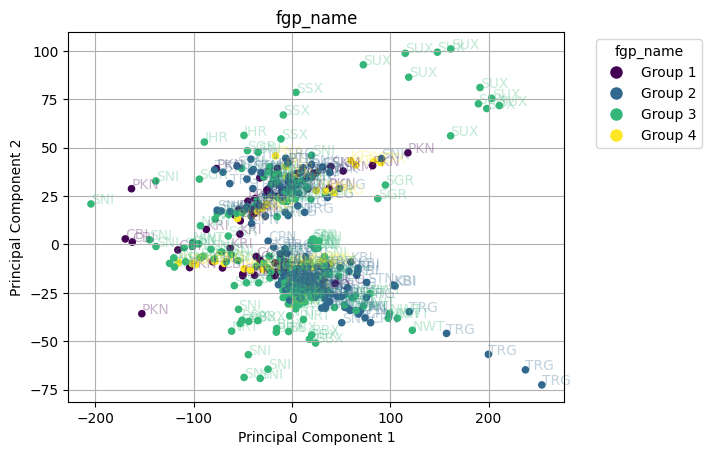

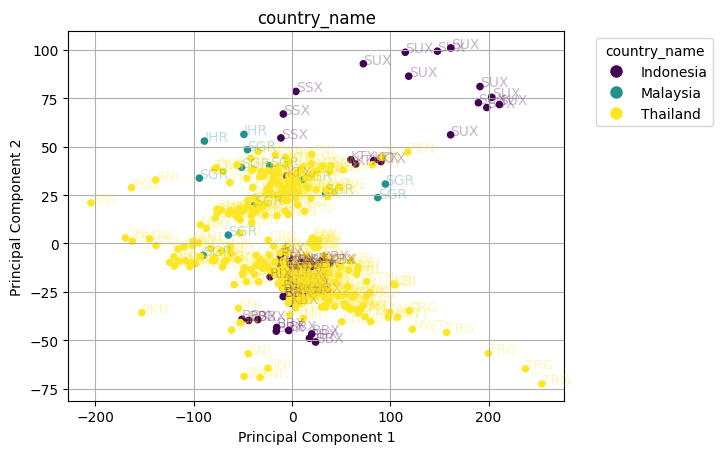

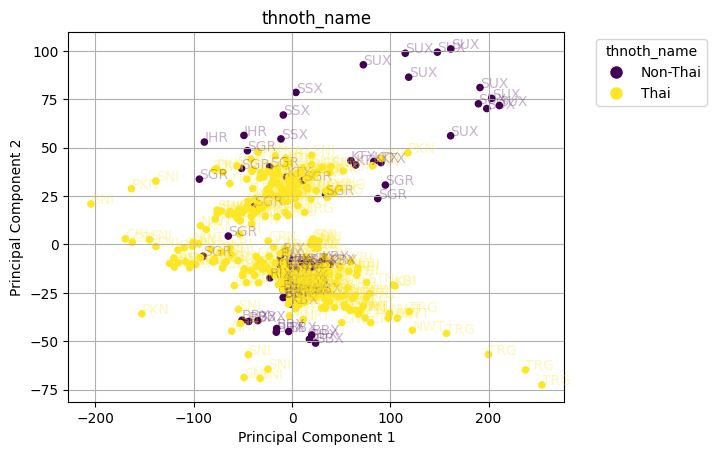

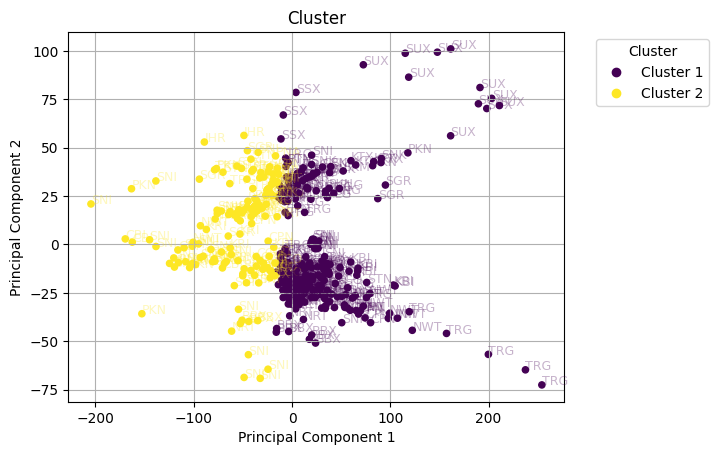

In [6]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

for i in range(len(string_cols)):
    encoded_categories = label_encoder.fit_transform(result_df[string_cols[i]])
    if i == 1:
        continue
    if i == 2:
        continue
    
    encoded_categories = label_encoder.fit_transform(result_df[string_cols[i]])
    
    # Create the scatter plot
    scatter = plt.scatter(result_df['Principal Component 1'], result_df['Principal Component 2'], 
                          c=encoded_categories, cmap='viridis', s=20)
    plt.title(string_cols[i])
    
    # Get the colormap and normalization from the scatter plot
    cmap = scatter.cmap
    norm = scatter.norm
    
    # Annotate points with 'Prov_Char' column
    for j in range(len(result_df)):
        plt.annotate(result_df['prov_char'].iloc[j], 
                     (result_df['Principal Component 1'].iloc[j], result_df['Principal Component 2'].iloc[j]), 
                     color=cmap(norm(encoded_categories[j])), alpha=0.3)
    

    # Customize the legend to show original string labels
    unique_labels = label_encoder.classes_
    handles = [plt.Line2D([0], [0], marker='o', color='w', label=label,
                          markersize=10, markerfacecolor=cmap(norm(value)))
               for value, label in enumerate(unique_labels)]
    
    plt.legend(handles=handles, title=string_cols[i], bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')

    plt.grid(True)
    plt.show()

plt.scatter(result_df['Principal Component 1'], result_df['Principal Component 2'], c=result_df['Cluster'], cmap='viridis', s=20)
plt.title('Cluster')

# Annotate points with 'Prov_Char' column
for x, y, label, color in zip(result_df['Principal Component 1'], 
                              result_df['Principal Component 2'], 
                              result_df['prov_char'], 
                              result_df['Cluster']):
    plt.text(x, y, label, color=plt.cm.viridis(color / max(result_df['Cluster'])), fontsize=9, alpha=0.3)

# Get handles and labels for the legend
handles, labels = scatter.legend_elements()

# Create cluster labels
unique_clusters = np.unique(result_df['Cluster'])
cluster_labels = [f'Cluster {cluster+1}' for cluster in unique_clusters]

# Update legend labels
updated_labels = [cluster_labels[int(label)] for label in unique_clusters]
plt.legend(handles, cluster_labels, title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)
plt.show()

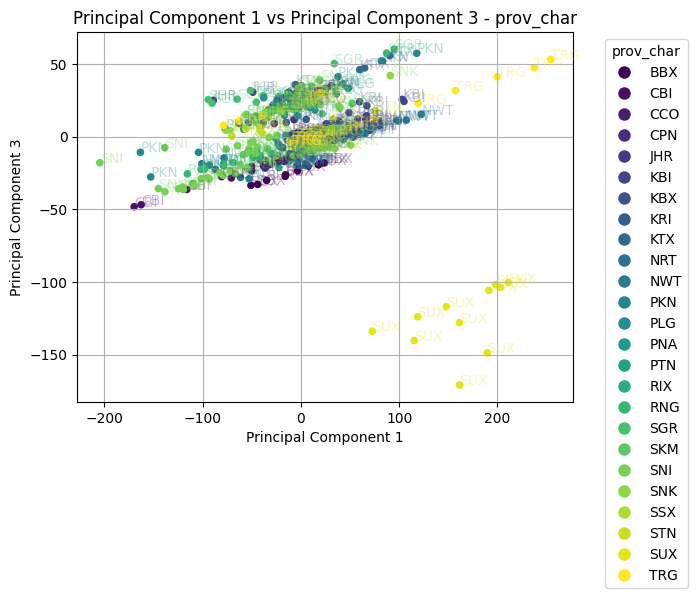

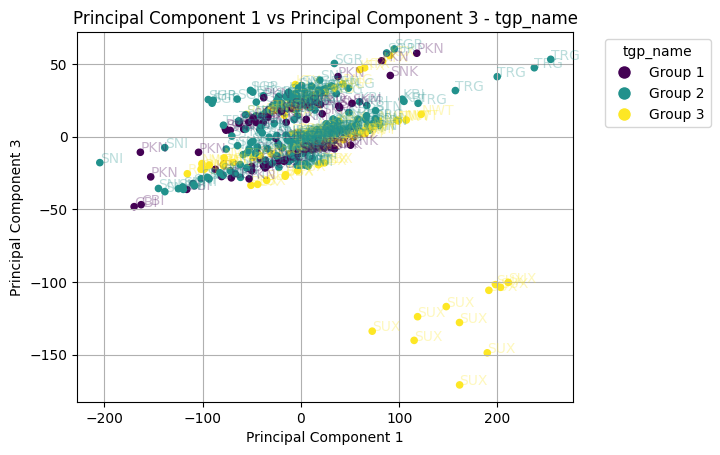

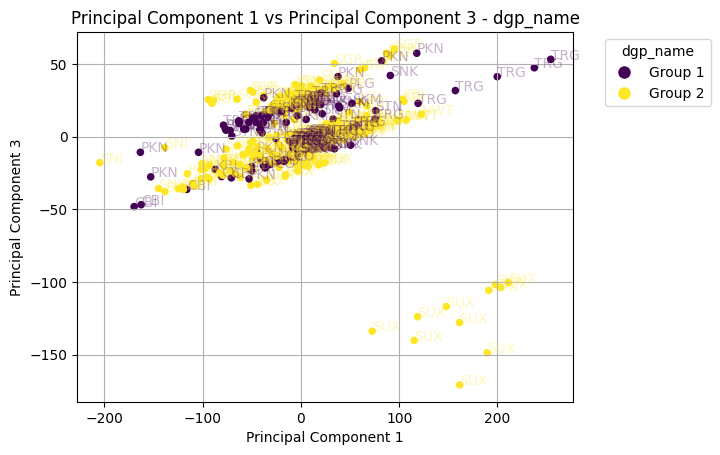

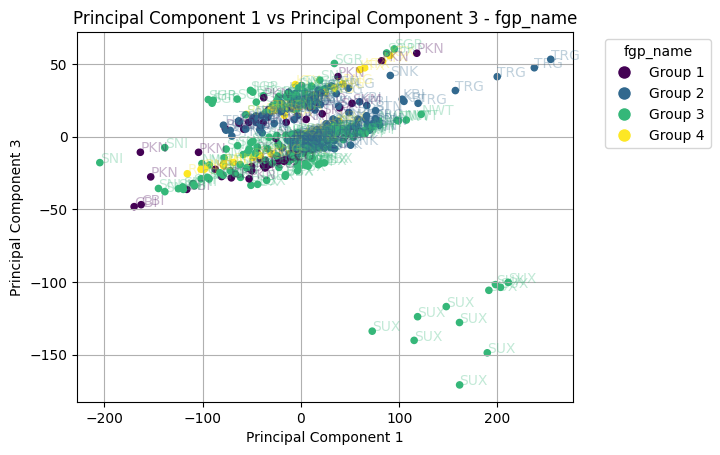

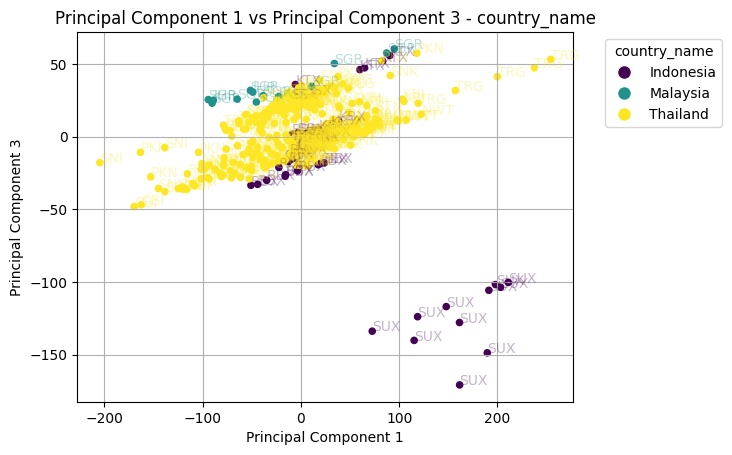

...

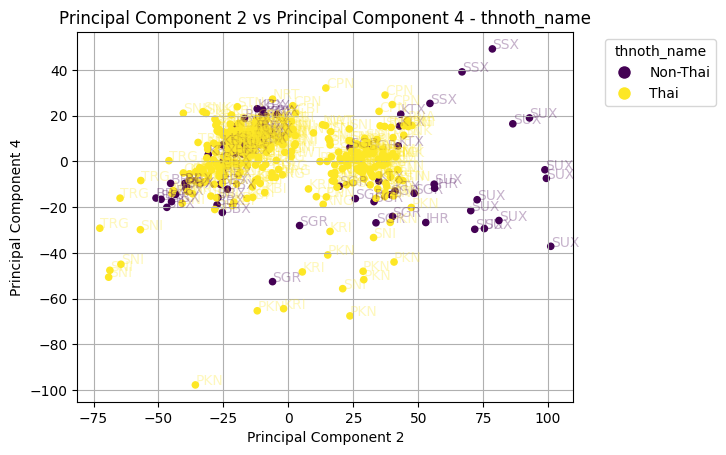

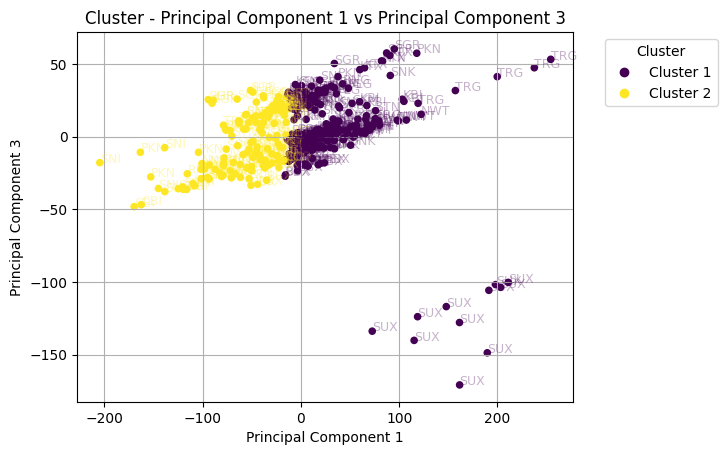

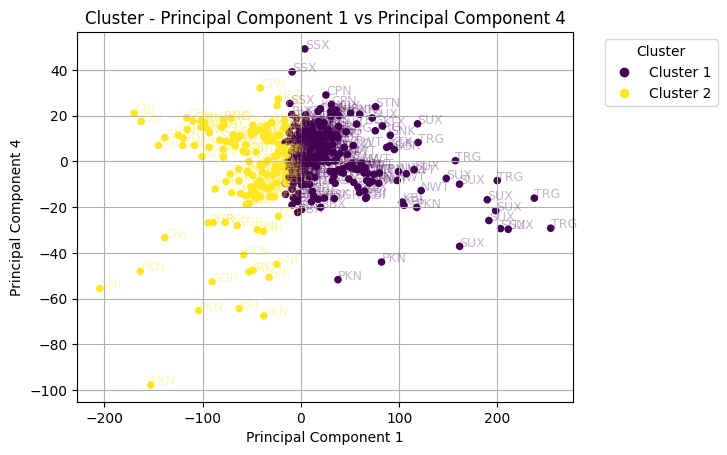

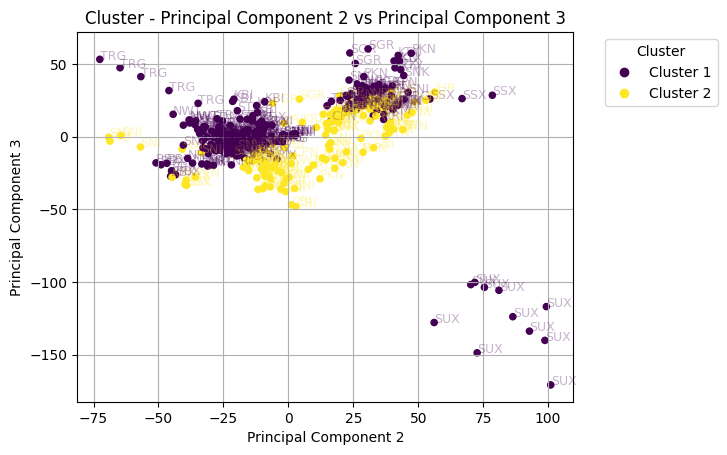

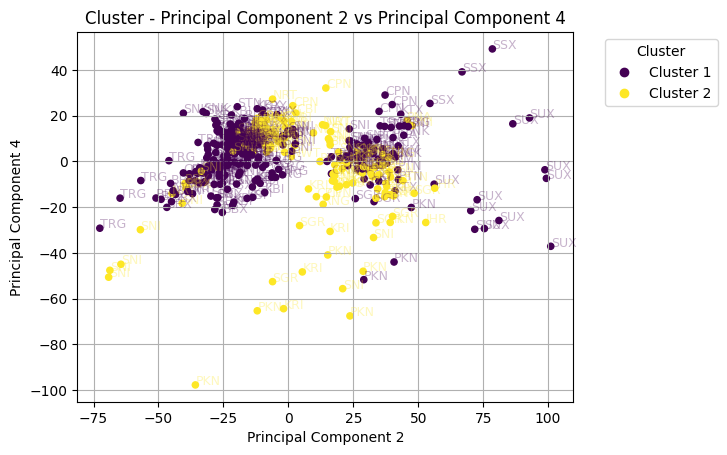

In [7]:
from sklearn.preprocessing import LabelEncoder

def plot_with_annotations_and_legend(result_df, comp1, comp2, string_cols):
    label_encoder = LabelEncoder()

    for i in range(len(string_cols)):
        encoded_categories = label_encoder.fit_transform(result_df[string_cols[i]])
        if i == 1 or i == 2:
            continue
        
        encoded_categories = label_encoder.fit_transform(result_df[string_cols[i]])
        
        # Create the scatter plot
        scatter = plt.scatter(result_df[comp1], result_df[comp2], 
                              c=encoded_categories, cmap='viridis', s=20)
        plt.title(f'{comp1} vs {comp2} - {string_cols[i]}')
        
        # Get the colormap and normalization from the scatter plot
        cmap = scatter.cmap
        norm = scatter.norm
        
        # Annotate points with 'Prov_Char' column
        for j in range(len(result_df)):
            plt.annotate(result_df['prov_char'].iloc[j], 
                         (result_df[comp1].iloc[j], result_df[comp2].iloc[j]), 
                         color=cmap(norm(encoded_categories[j])), alpha=0.3)
        
        # Customize the legend to show original string labels
        unique_labels = label_encoder.classes_
        handles = [plt.Line2D([0], [0], marker='o', color='w', label=label,
                              markersize=10, markerfacecolor=cmap(norm(value)))
                   for value, label in enumerate(unique_labels)]
        
        plt.legend(handles=handles, title=string_cols[i], bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.xlabel(comp1)
        plt.ylabel(comp2)
        plt.grid(True)
        plt.show()

# Plotting PC1 vs PC3, PC1 vs PC4, PC2 vs PC3, and PC2 vs PC4 with annotations and legends
plot_with_annotations_and_legend(result_df, 'Principal Component 1', 'Principal Component 3', string_cols)
plot_with_annotations_and_legend(result_df, 'Principal Component 1', 'Principal Component 4', string_cols)
plot_with_annotations_and_legend(result_df, 'Principal Component 2', 'Principal Component 3', string_cols)
plot_with_annotations_and_legend(result_df, 'Principal Component 2', 'Principal Component 4', string_cols)

# Clustering plots for the new combinations
def plot_clusters(result_df, comp1, comp2):
    plt.scatter(result_df[comp1], result_df[comp2], c=result_df['Cluster'], cmap='viridis', s=20)
    plt.title(f'Cluster - {comp1} vs {comp2}')
    
    # Annotate points with 'Prov_Char' column
    for x, y, label, color in zip(result_df[comp1], 
                                  result_df[comp2], 
                                  result_df['prov_char'], 
                                  result_df['Cluster']):
        plt.text(x, y, label, color=plt.cm.viridis(color / max(result_df['Cluster'])), fontsize=9, alpha=0.3)

    # Get handles and labels for the legend
    handles, labels = scatter.legend_elements()

    # Create cluster labels
    unique_clusters = np.unique(result_df['Cluster'])
    cluster_labels = [f'Cluster {cluster+1}' for cluster in unique_clusters]

    # Update legend labels
    updated_labels = [cluster_labels[int(label)] for label in unique_clusters]
    plt.legend(handles, cluster_labels, title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.xlabel(comp1)
    plt.ylabel(comp2)
    plt.grid(True)
    plt.show()

# Clustering plots for PC1 vs PC3, PC1 vs PC4, PC2 vs PC3, and PC2 vs PC4
plot_clusters(result_df, 'Principal Component 1', 'Principal Component 3')
plot_clusters(result_df, 'Principal Component 1', 'Principal Component 4')
plot_clusters(result_df, 'Principal Component 2', 'Principal Component 3')
plot_clusters(result_df, 'Principal Component 2', 'Principal Component 4')


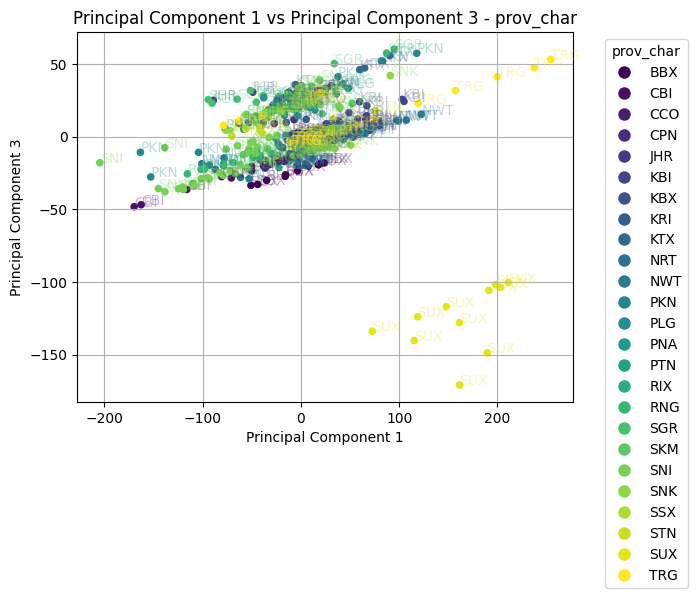

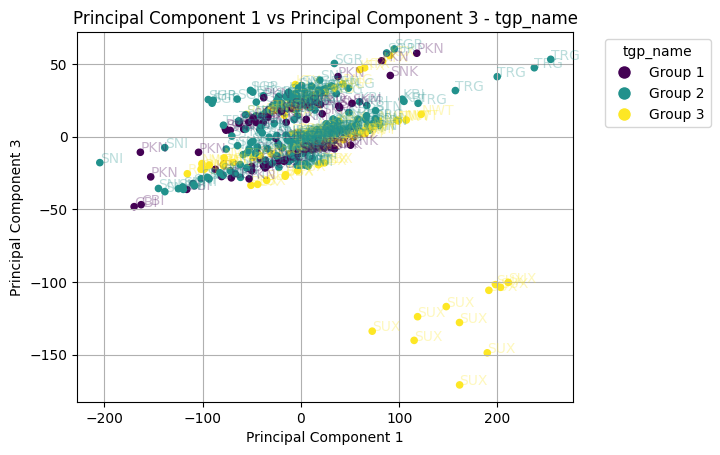

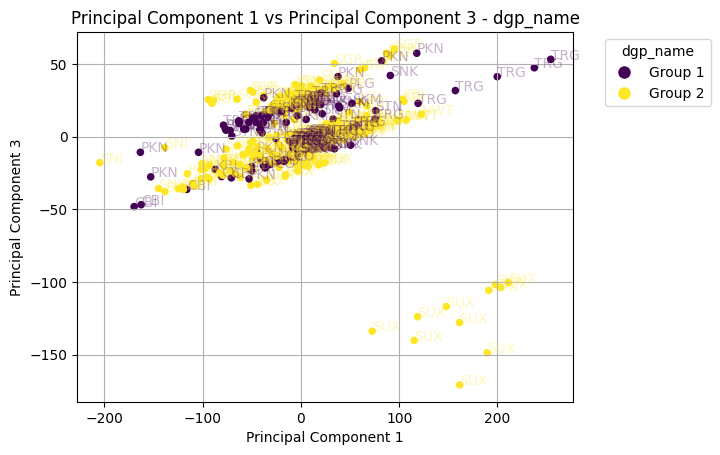

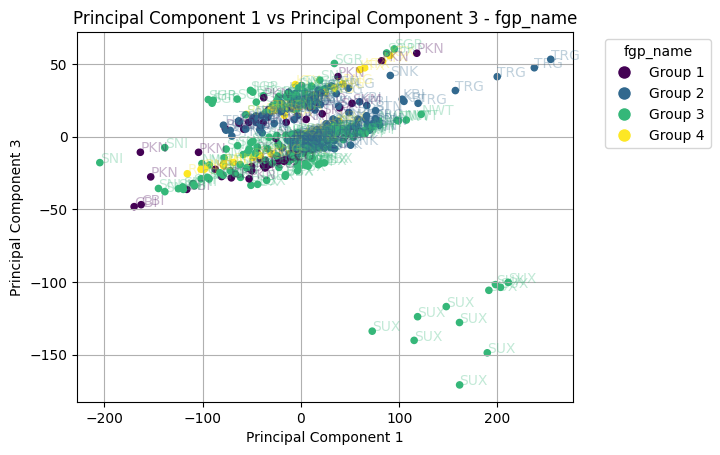

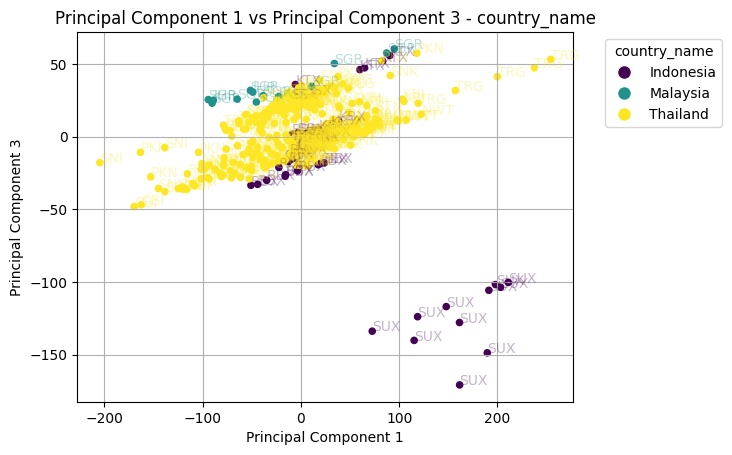

...

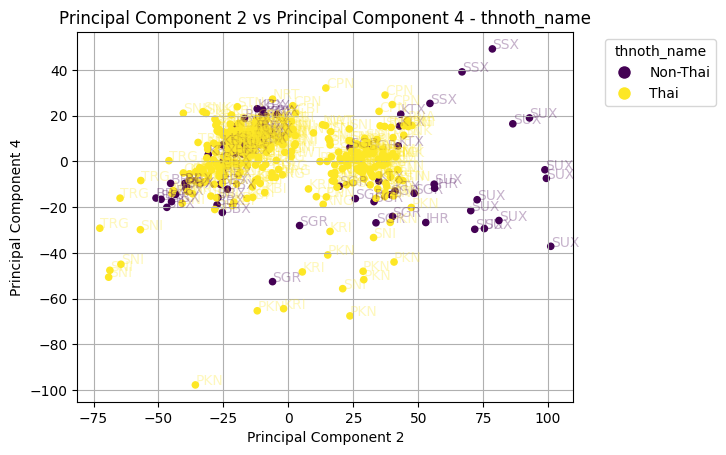

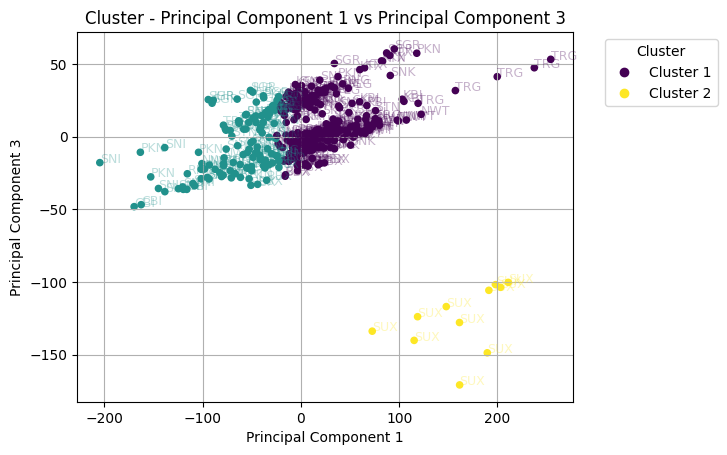

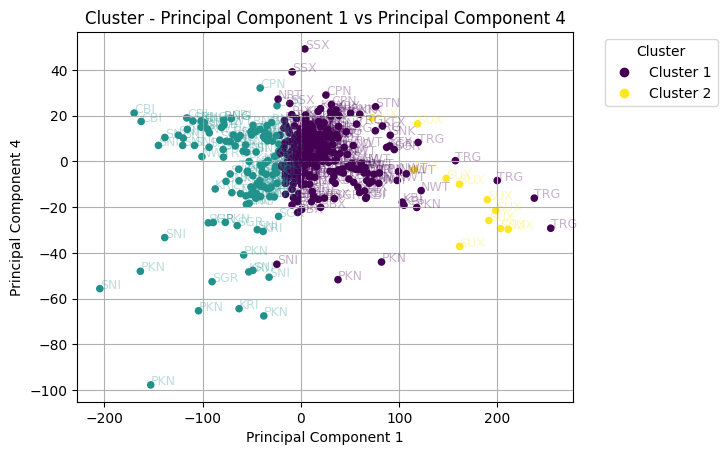

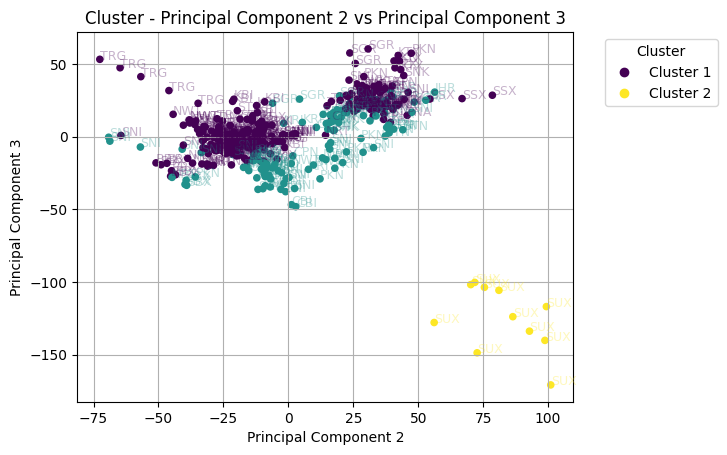

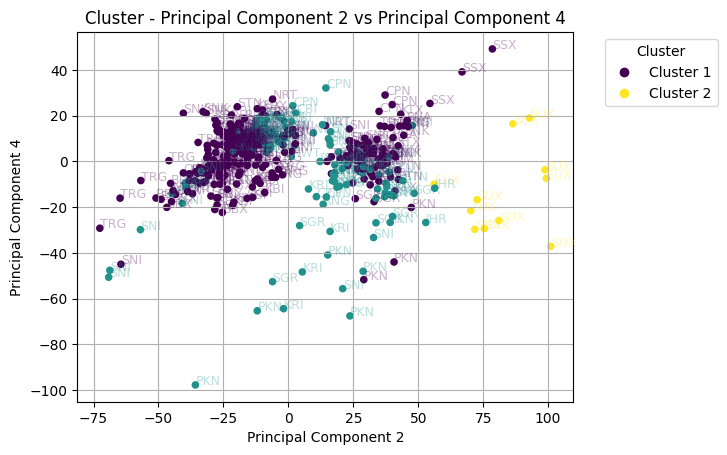

In [8]:
from sklearn.preprocessing import LabelEncoder

# Perform KMeans clustering with n_clusters=3
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(result_df.select_dtypes(include=[np.number]))
result_df['Cluster'] = clusters

def plot_with_annotations_and_legend(result_df, comp1, comp2, string_cols):
    label_encoder = LabelEncoder()

    for i in range(len(string_cols)):
        encoded_categories = label_encoder.fit_transform(result_df[string_cols[i]])
        if i == 1 or i == 2:
            continue
        
        encoded_categories = label_encoder.fit_transform(result_df[string_cols[i]])
        
        # Create the scatter plot
        scatter = plt.scatter(result_df[comp1], result_df[comp2], 
                              c=encoded_categories, cmap='viridis', s=20)
        plt.title(f'{comp1} vs {comp2} - {string_cols[i]}')
        
        # Get the colormap and normalization from the scatter plot
        cmap = scatter.cmap
        norm = scatter.norm
        
        # Annotate points with 'Prov_Char' column
        for j in range(len(result_df)):
            plt.annotate(result_df['prov_char'].iloc[j], 
                         (result_df[comp1].iloc[j], result_df[comp2].iloc[j]), 
                         color=cmap(norm(encoded_categories[j])), alpha=0.3)
        
        # Customize the legend to show original string labels
        unique_labels = label_encoder.classes_
        handles = [plt.Line2D([0], [0], marker='o', color='w', label=label,
                              markersize=10, markerfacecolor=cmap(norm(value)))
                   for value, label in enumerate(unique_labels)]
        
        plt.legend(handles=handles, title=string_cols[i], bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.xlabel(comp1)
        plt.ylabel(comp2)
        plt.grid(True)
        plt.show()

# Plotting PC1 vs PC3, PC1 vs PC4, PC2 vs PC3, and PC2 vs PC4 with annotations and legends
plot_with_annotations_and_legend(result_df, 'Principal Component 1', 'Principal Component 3', string_cols)
plot_with_annotations_and_legend(result_df, 'Principal Component 1', 'Principal Component 4', string_cols)
plot_with_annotations_and_legend(result_df, 'Principal Component 2', 'Principal Component 3', string_cols)
plot_with_annotations_and_legend(result_df, 'Principal Component 2', 'Principal Component 4', string_cols)

# Clustering plots for the new combinations
def plot_clusters(result_df, comp1, comp2):
    plt.scatter(result_df[comp1], result_df[comp2], c=result_df['Cluster'], cmap='viridis', s=20)
    plt.title(f'Cluster - {comp1} vs {comp2}')
    
    # Annotate points with 'Prov_Char' column
    for x, y, label, color in zip(result_df[comp1], 
                                  result_df[comp2], 
                                  result_df['prov_char'], 
                                  result_df['Cluster']):
        plt.text(x, y, label, color=plt.cm.viridis(color / max(result_df['Cluster'])), fontsize=9, alpha=0.3)

    # Get handles and labels for the legend
    handles, labels = scatter.legend_elements()

    # Create cluster labels
    unique_clusters = np.unique(result_df['Cluster'])
    cluster_labels = [f'Cluster {cluster+1}' for cluster in unique_clusters]

    # Update legend labels
    updated_labels = [cluster_labels[int(label)] for label in unique_clusters]
    plt.legend(handles, cluster_labels, title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.xlabel(comp1)
    plt.ylabel(comp2)
    plt.grid(True)
    plt.show()

# Clustering plots for PC1 vs PC3, PC1 vs PC4, PC2 vs PC3, and PC2 vs PC4
plot_clusters(result_df, 'Principal Component 1', 'Principal Component 3')
plot_clusters(result_df, 'Principal Component 1', 'Principal Component 4')
plot_clusters(result_df, 'Principal Component 2', 'Principal Component 3')
plot_clusters(result_df, 'Principal Component 2', 'Principal Component 4')


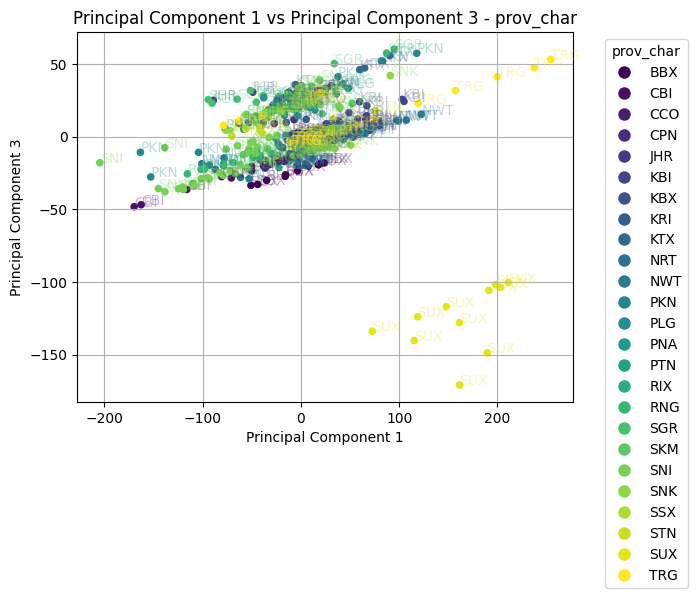

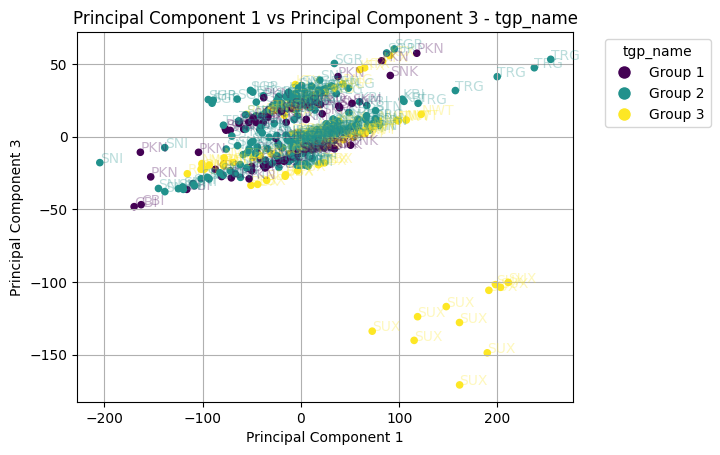

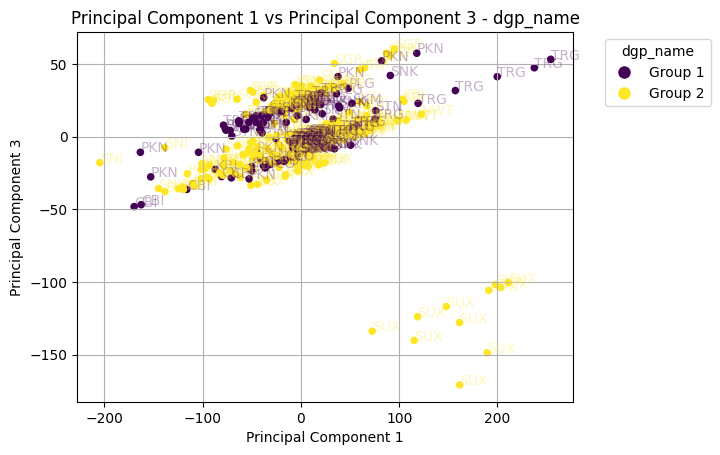

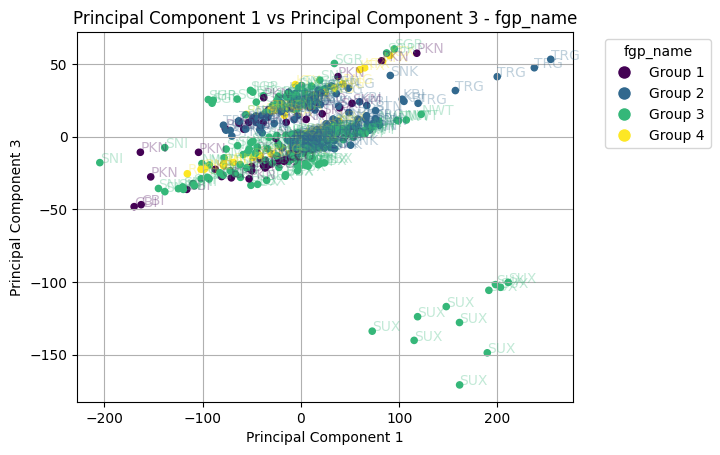

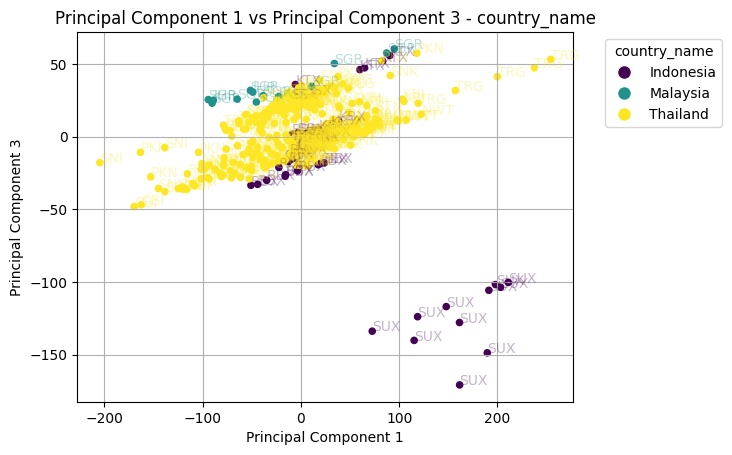

...

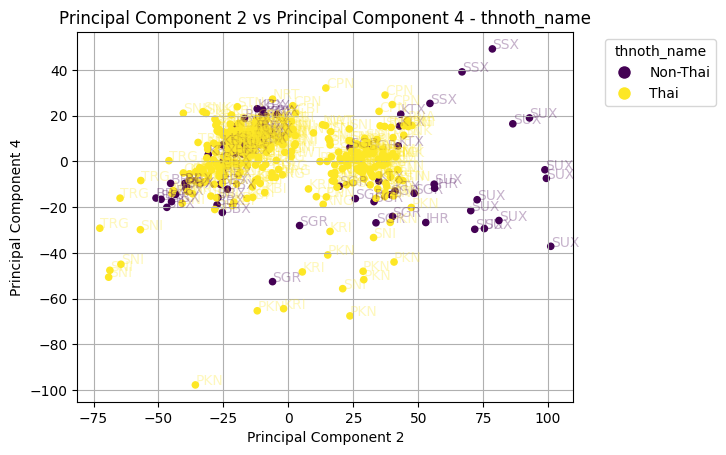

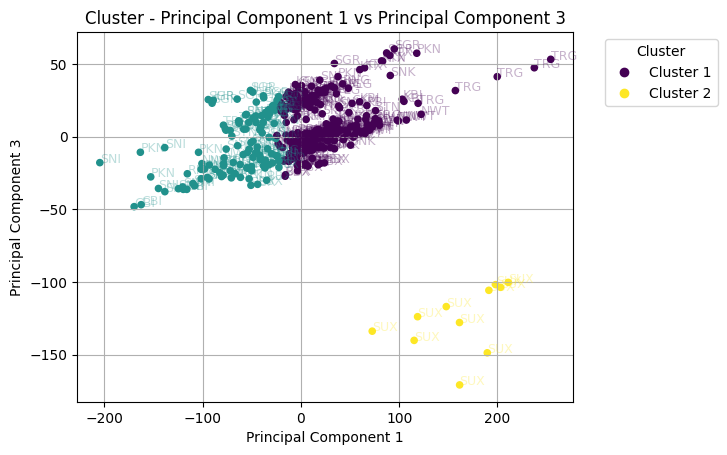

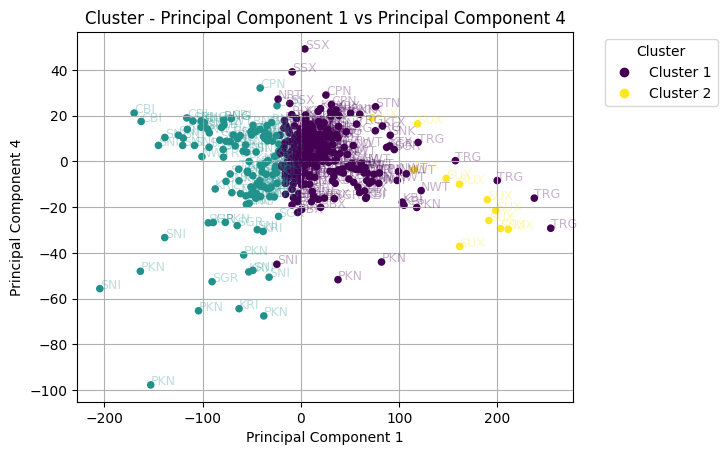

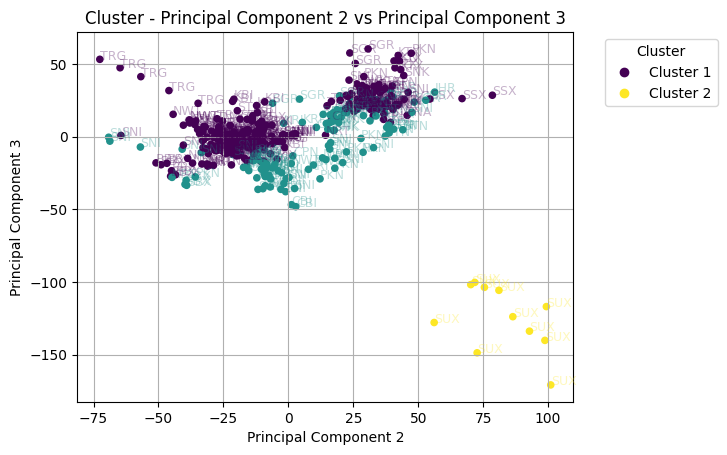

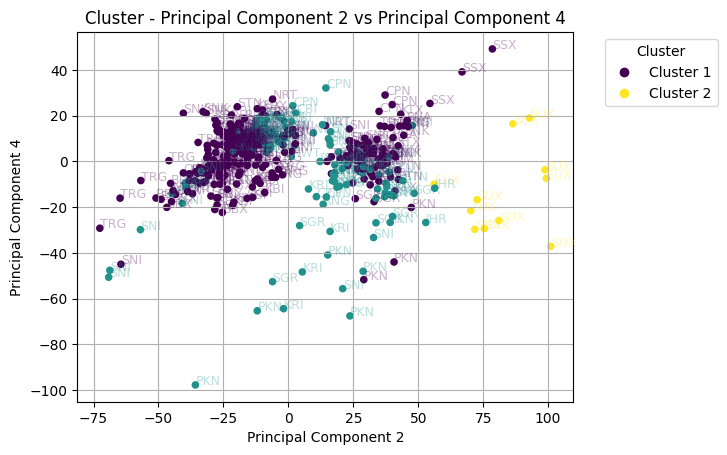

In [9]:
from sklearn.preprocessing import LabelEncoder

# Perform KMeans clustering with n_clusters=3
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(result_df.select_dtypes(include=[np.number]))
result_df['Cluster'] = clusters

def plot_with_annotations_and_legend(result_df, comp1, comp2, string_cols):
    label_encoder = LabelEncoder()

    for i in range(len(string_cols)):
        encoded_categories = label_encoder.fit_transform(result_df[string_cols[i]])
        if i == 1 or i == 2:
            continue
        
        encoded_categories = label_encoder.fit_transform(result_df[string_cols[i]])
        
        # Create the scatter plot
        scatter = plt.scatter(result_df[comp1], result_df[comp2], 
                              c=encoded_categories, cmap='viridis', s=20)
        plt.title(f'{comp1} vs {comp2} - {string_cols[i]}')
        
        # Get the colormap and normalization from the scatter plot
        cmap = scatter.cmap
        norm = scatter.norm
        
        # Annotate points with 'Prov_Char' column
        for j in range(len(result_df)):
            plt.annotate(result_df['prov_char'].iloc[j], 
                         (result_df[comp1].iloc[j], result_df[comp2].iloc[j]), 
                         color=cmap(norm(encoded_categories[j])), alpha=0.3)
        
        # Customize the legend to show original string labels
        unique_labels = label_encoder.classes_
        handles = [plt.Line2D([0], [0], marker='o', color='w', label=label,
                              markersize=10, markerfacecolor=cmap(norm(value)))
                   for value, label in enumerate(unique_labels)]
        
        plt.legend(handles=handles, title=string_cols[i], bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.xlabel(comp1)
        plt.ylabel(comp2)
        plt.grid(True)
        plt.show()

# Plotting PC1 vs PC3, PC1 vs PC4, PC2 vs PC3, and PC2 vs PC4 with annotations and legends
plot_with_annotations_and_legend(result_df, 'Principal Component 1', 'Principal Component 3', string_cols)
plot_with_annotations_and_legend(result_df, 'Principal Component 1', 'Principal Component 4', string_cols)
plot_with_annotations_and_legend(result_df, 'Principal Component 2', 'Principal Component 3', string_cols)
plot_with_annotations_and_legend(result_df, 'Principal Component 2', 'Principal Component 4', string_cols)

# Clustering plots for the new combinations
def plot_clusters(result_df, comp1, comp2):
    plt.scatter(result_df[comp1], result_df[comp2], c=result_df['Cluster'], cmap='viridis', s=20)
    plt.title(f'Cluster - {comp1} vs {comp2}')
    
    # Annotate points with 'Prov_Char' column
    for x, y, label, color in zip(result_df[comp1], 
                                  result_df[comp2], 
                                  result_df['prov_char'], 
                                  result_df['Cluster']):
        plt.text(x, y, label, color=plt.cm.viridis(color / max(result_df['Cluster'])), fontsize=9, alpha=0.3)

    # Get handles and labels for the legend
    handles, labels = scatter.legend_elements()

    # Create cluster labels
    unique_clusters = np.unique(result_df['Cluster'])
    cluster_labels = [f'Cluster {cluster+1}' for cluster in unique_clusters]

    # Update legend labels
    updated_labels = [cluster_labels[int(label)] for label in unique_clusters]
    plt.legend(handles, cluster_labels, title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.xlabel(comp1)
    plt.ylabel(comp2)
    plt.grid(True)
    plt.show()

# Clustering plots for PC1 vs PC3, PC1 vs PC4, PC2 vs PC3, and PC2 vs PC4
plot_clusters(result_df, 'Principal Component 1', 'Principal Component 3')
plot_clusters(result_df, 'Principal Component 1', 'Principal Component 4')
plot_clusters(result_df, 'Principal Component 2', 'Principal Component 3')
plot_clusters(result_df, 'Principal Component 2', 'Principal Component 4')


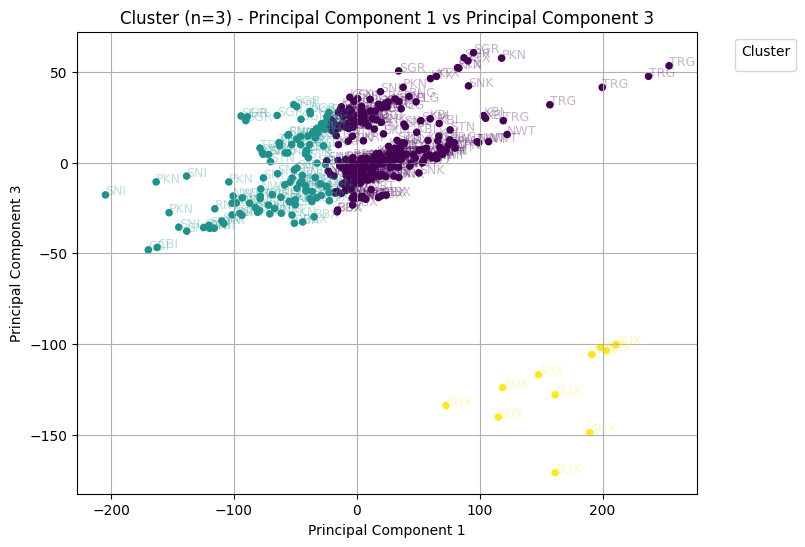

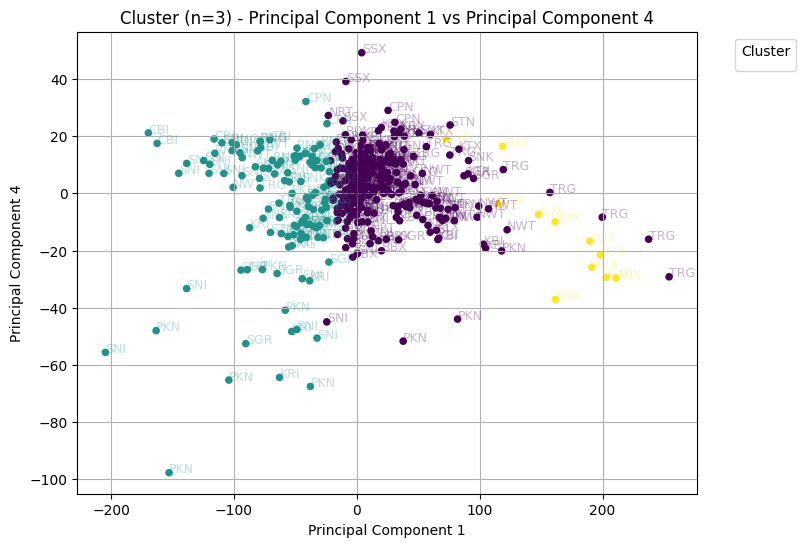

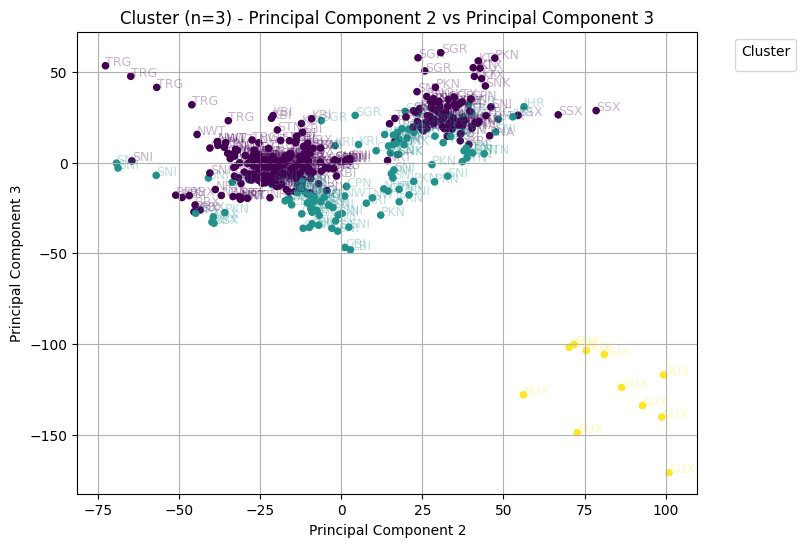

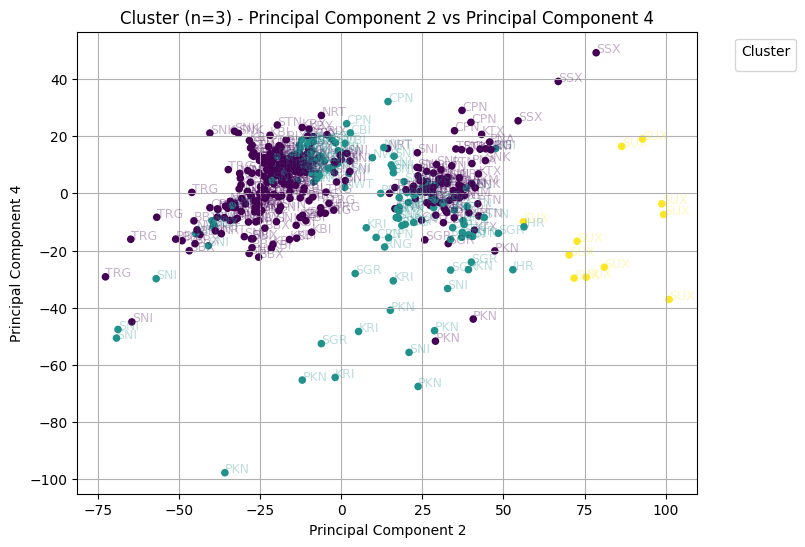

In [10]:
# Perform KMeans clustering with n_clusters=3 and use a different function name
kmeans_3_clusters = KMeans(n_clusters=3, random_state=42)
clusters_3 = kmeans_3_clusters.fit_predict(result_df.select_dtypes(include=[np.number]))
result_df['Cluster_3'] = clusters_3

# Function to plot clustering results for given principal components
def plot_clusters_3(result_df, comp1, comp2):
    plt.figure(figsize=(8, 6))
    plt.scatter(result_df[comp1], result_df[comp2], c=result_df['Cluster_3'], cmap='viridis', s=20)
    plt.title(f'Cluster (n=3) - {comp1} vs {comp2}')
    
    # Annotate points with 'Prov_Char' column
    for x, y, label, color in zip(result_df[comp1], 
                                  result_df[comp2], 
                                  result_df['prov_char'], 
                                  result_df['Cluster_3']):
        plt.text(x, y, label, color=plt.cm.viridis(color / max(result_df['Cluster_3'])), fontsize=9, alpha=0.3)

    # Get handles and labels for the legend
    handles, labels = plt.gca().get_legend_handles_labels()

    # Create cluster labels
    unique_clusters = np.unique(result_df['Cluster_3'])
    cluster_labels = [f'Cluster {cluster+1}' for cluster in unique_clusters]

    # Update legend labels
    updated_labels = [cluster_labels[int(label)] for label in unique_clusters]
    plt.legend(handles, cluster_labels, title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.xlabel(comp1)
    plt.ylabel(comp2)
    plt.grid(True)
    plt.show()

# Clustering plots for PC1 vs PC3, PC1 vs PC4, PC2 vs PC3, and PC2 vs PC4
plot_clusters_3(result_df, 'Principal Component 1', 'Principal Component 3')
plot_clusters_3(result_df, 'Principal Component 1', 'Principal Component 4')
plot_clusters_3(result_df, 'Principal Component 2', 'Principal Component 3')
plot_clusters_3(result_df, 'Principal Component 2', 'Principal Component 4')
